In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
import mpld3
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
import visualkeras
#from google.colab import files
from sklearn.preprocessing import minmax_scale
import plotly.express as px

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


In [2]:
url = 'https://raw.githubusercontent.com/mrm202/Pavement/master/Pavements%20Dataset.csv'
pavement_data = pd.read_csv(url)

In [3]:
print(pavement_data.shape)

(5025, 12)


In [4]:
pavement_data

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E1,E2,E3,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,7621,340,160,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,1517,494,190,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,1356,209,100,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,7492,239,105,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,7074,499,119,0.298245
...,...,...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,1601,293,33,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,1822,396,36,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,6324,227,39,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,3565,388,35,0.440157


In [5]:
pavement_stats = pavement_data.describe()
pavement_stats = pavement_stats.transpose()
pavement_stats

,count,mean,std,min,25%,50%,75%,max
H1,5025.0,144.767164,60.942393,40.000000,93.000000,144.000000,198.000000,250.000000
H2,5025.0,374.162388,130.298794,150.000000,262.000000,374.000000,487.000000,600.000000
lnD1,5025.0,-1.072320,0.405720,-2.067197,-1.366609,-1.088771,-0.795136,0.360384
lnD2,5025.0,-1.462896,0.383042,-2.319935,-1.744628,-1.517451,-1.224482,-0.097481
lnD3,5025.0,-1.847806,0.425674,-2.592269,-2.196335,-1.934061,-1.561696,-0.494985
lnD4,5025.0,-2.075730,0.435778,-3.085001,-2.433149,-2.167967,-1.784446,-0.848866
lnD5,5025.0,-2.459316,0.525963,-3.466696,-2.893176,-2.567723,-2.086023,-1.109208
lnD6,5025.0,-2.655686,0.534085,-3.476029,-3.110021,-2.766845,-2.277892,-1.329196
E1,5025.0,4806.780697,2183.635182,1002.000000,2916.000000,4844.000000,6699.000000,8579.000000
E2,5025.0,324.797214,101.824757,150.000000,236.000000,328.000000,412.000000,500.000000


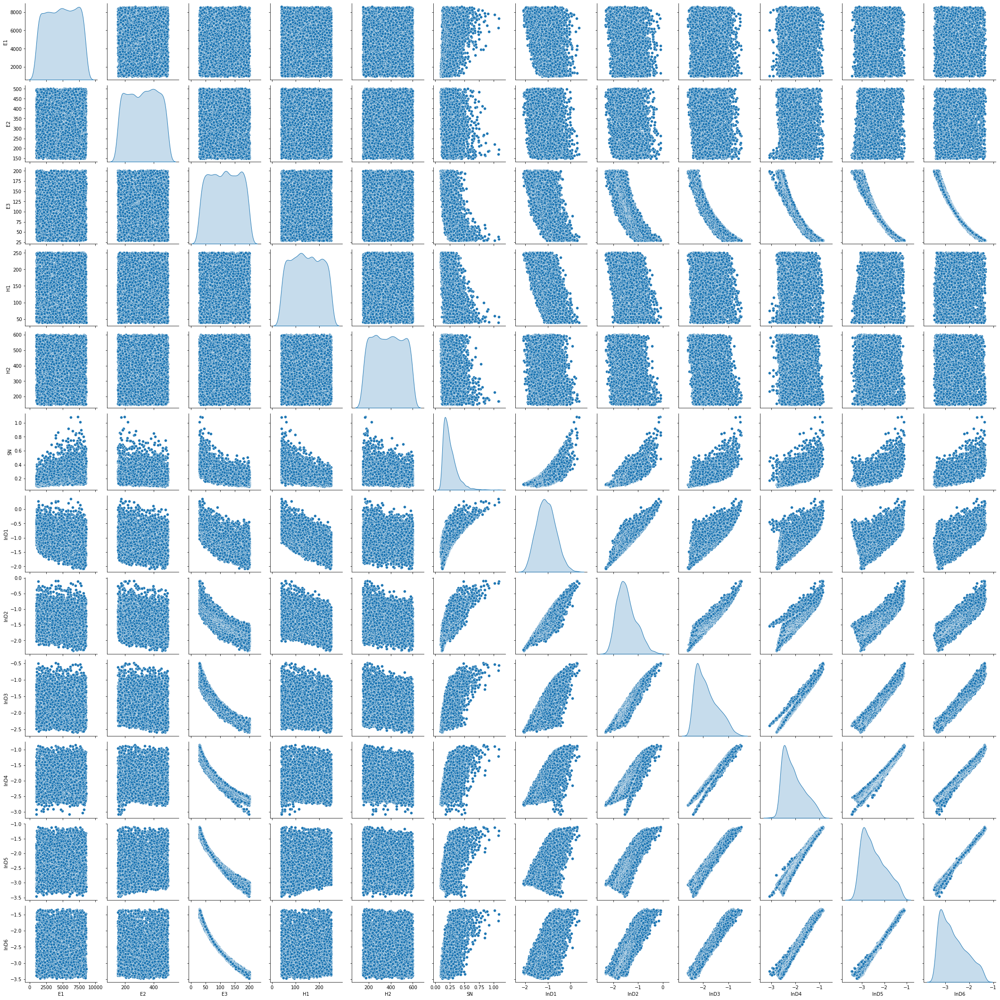

In [6]:
sns.pairplot(pavement_data[['E1',	'E2',	'E3',	'H1',	'H2',	'SN',	'lnD1',	'lnD2',	'lnD3',	'lnD4',	'lnD5',	'lnD6']], diag_kind="kde")

For D1 to D6, E1, E2, E3 and H1 and H2 are inputs
So training dataset should contain only these variables.

# Model for D1

In [7]:
dataset_lnD1 = pavement_data.drop(['lnD2', 'lnD3', 'lnD4', 'lnD5', 'lnD6'], axis =1)
dataset_lnD1

,H1,H2,lnD1,E1,E2,E3,SN
0,74,351,-1.090704,7621,340,160,0.295591
1,97,226,-1.077605,1517,494,190,0.141169
2,220,287,-0.917942,1356,209,100,0.147625
3,60,538,-0.734115,7492,239,105,0.405743
4,40,578,-1.050622,7074,499,119,0.298245
...,...,...,...,...,...,...,...
5020,155,373,-0.385942,1601,293,33,0.300245
5021,65,234,-0.034519,1822,396,36,0.461535
5022,151,231,-0.530586,6324,227,39,0.479972
5023,96,336,-0.390793,3565,388,35,0.440157


In [8]:
train_dataset_lnD1 = dataset_lnD1.iloc[:4200,:]
test_dataset_lnD1 = dataset_lnD1.iloc[4200:,:]
train_dataset_lnD1

,H1,H2,lnD1,E1,E2,E3,SN
0,74,351,-1.090704,7621,340,160,0.295591
1,97,226,-1.077605,1517,494,190,0.141169
2,220,287,-0.917942,1356,209,100,0.147625
3,60,538,-0.734115,7492,239,105,0.405743
4,40,578,-1.050622,7074,499,119,0.298245
...,...,...,...,...,...,...,...
4195,120,366,-1.073354,5689,356,92,0.270546
4196,147,402,-1.473160,7934,418,122,0.218286
4197,43,419,-0.565159,8342,247,103,0.505022
4198,199,421,-1.262803,4539,175,108,0.186703


In [9]:
test_dataset_lnD1

,H1,H2,lnD1,E1,E2,E3,SN
4200,190,374,-1.540658,5358,437,124,0.170066
4201,68,241,-0.486637,2531,157,160,0.274840
4202,176,593,-1.630662,4996,462,132,0.149620
4203,145,205,-1.582115,6429,490,198,0.176629
4204,50,344,-0.489586,6762,157,158,0.467783
...,...,...,...,...,...,...,...
5020,155,373,-0.385942,1601,293,33,0.300245
5021,65,234,-0.034519,1822,396,36,0.461535
5022,151,231,-0.530586,6324,227,39,0.479972
5023,96,336,-0.390793,3565,388,35,0.440157


In [10]:
train_stats_lnD1 = train_dataset_lnD1.describe()
train_stats_lnD1.pop("lnD1")
train_stats_lnD1 = train_stats_lnD1.transpose()
#train_stats_lnD1


In [11]:
train_labels_lnD1 = train_dataset_lnD1.pop('lnD1')
test_labels_lnD1 = test_dataset_lnD1.pop('lnD1')

In [12]:
train_dataset_lnD1

,H1,H2,E1,E2,E3,SN
0,74,351,7621,340,160,0.295591
1,97,226,1517,494,190,0.141169
2,220,287,1356,209,100,0.147625
3,60,538,7492,239,105,0.405743
4,40,578,7074,499,119,0.298245
...,...,...,...,...,...,...
4195,120,366,5689,356,92,0.270546
4196,147,402,7934,418,122,0.218286
4197,43,419,8342,247,103,0.505022
4198,199,421,4539,175,108,0.186703


In [13]:
test_dataset_lnD1

,H1,H2,E1,E2,E3,SN
4200,190,374,5358,437,124,0.170066
4201,68,241,2531,157,160,0.274840
4202,176,593,4996,462,132,0.149620
4203,145,205,6429,490,198,0.176629
4204,50,344,6762,157,158,0.467783
...,...,...,...,...,...,...
5020,155,373,1601,293,33,0.300245
5021,65,234,1822,396,36,0.461535
5022,151,231,6324,227,39,0.479972
5023,96,336,3565,388,35,0.440157


In [14]:
def norm(x):
  return (x - train_stats_lnD1['mean']) / train_stats_lnD1['std']
normed_train_data_lnD1 = norm(train_dataset_lnD1)
normed_test_data_lnD1 = norm(test_dataset_lnD1)

In [15]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_lnD1.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [16]:
model = build_model()

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                448       
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 4,673
Trainable params: 4,673
Non-trainable params: 0
_________________________________________________________________


In [18]:
example_batch = normed_train_data_lnD1[:10]
example_result = model.predict(example_batch)
example_result

array([[ 0.24721318],
       [-0.5066363 ],
       [-0.11899315],
       [ 0.11751179],
       [-0.12069133],
       [-0.27314758],
       [-0.4690625 ],
       [-0.18057536],
       [-0.48997504],
       [-0.10683846]], dtype=float32)

In [19]:
EPOCHS = 2000

history = model.fit(
  normed_train_data_lnD1, train_labels_lnD1,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.0812,  mae:0.2004,  mse:0.0812,  val_loss:0.0170,  val_mae:0.1019,  val_mse:0.0170,  
....................................................................................................
Epoch: 100, loss:0.0002,  mae:0.0113,  mse:0.0002,  val_loss:0.0001,  val_mae:0.0074,  val_mse:0.0001,  
....................................................................................................
Epoch: 200, loss:0.0001,  mae:0.0083,  mse:0.0001,  val_loss:0.0003,  val_mae:0.0149,  val_mse:0.0003,  
....................................................................................................
Epoch: 300, loss:0.0001,  mae:0.0082,  mse:0.0001,  val_loss:0.0000,  val_mae:0.0037,  val_mse:0.0000,  
....................................................................................................
Epoch: 400, loss:0.0001,  mae:0.0074,  mse:0.0001,  val_loss:0.0000,  val_mae:0.0034,  val_mse:0.0000,  
........................................................................

In [20]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,0.081220,0.200360,0.081220,0.017027,0.101896,0.017027,0
1,0.010537,0.080656,0.010537,0.004784,0.054951,0.004784,1
2,0.005625,0.059282,0.005625,0.006312,0.064085,0.006312,2
3,0.004621,0.053660,0.004621,0.003093,0.043797,0.003093,3
4,0.003866,0.048467,0.003866,0.011063,0.093308,0.011063,4


In [21]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [lnD1]')

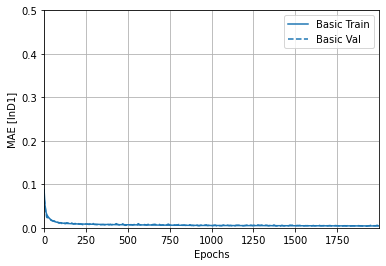

In [22]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [lnD1]')

Text(0, 0.5, 'MSE [lnD1^2]')

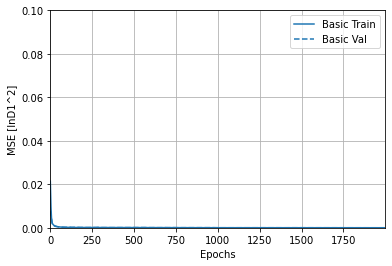

In [23]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 0.1])
plt.ylabel('MSE [lnD1^2]')

In [24]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [25]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [lnD1]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [lnD1]\')'

In [26]:
loss, mae, mse = model.evaluate(normed_test_data_lnD1, test_labels_lnD1, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} lnD1".format(mae))

26/26 - 0s - loss: 2.9638e-05 - mae: 0.0043 - mse: 2.9638e-05
Testing set Mean Abs Error:  0.00 lnD1


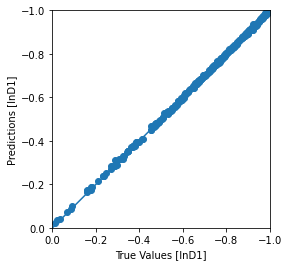

<Figure size 432x288 with 0 Axes>

In [27]:
test_predictions_lnD1 = model.predict(normed_test_data_lnD1).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_lnD1, test_predictions_lnD1)
plt.xlabel('True Values [lnD1]')
plt.ylabel('Predictions [lnD1]')
lims = [0, -1]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.show()

plt.savefig("lnD1_ANN.png")
#files.download("lnD1_ANN.png") 

In [28]:
fig = px.scatter(x=test_labels_lnD1, y=test_predictions_lnD1, title="Actual vs Predicted lnD1")
fig.show()

In [29]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

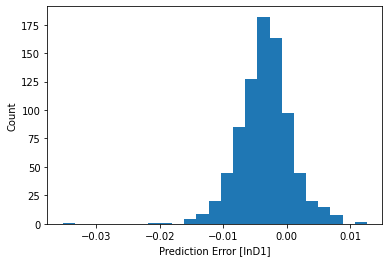

In [30]:
error_lnD1 = test_predictions_lnD1 - test_labels_lnD1
plt.hist(error_lnD1, bins = 25)
plt.xlabel("Prediction Error [lnD1]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [31]:
fig = px.histogram(error_lnD1, title='Histogram of Prediction Errors of lnD1', labels = {'lnD1' : 'error_lnD1'})
fig.show()


# Model for D2

In [32]:
dataset_lnD2 = pavement_data.drop(['lnD1', 'lnD3', 'lnD4', 'lnD5', 'lnD6'], axis =1)
dataset_lnD2

,H1,H2,lnD2,E1,E2,E3,SN
0,74,351,-1.644029,7621,340,160,0.295591
1,97,226,-1.760493,1517,494,190,0.141169
2,220,287,-1.339258,1356,209,100,0.147625
3,60,538,-1.342775,7492,239,105,0.405743
4,40,578,-1.746576,7074,499,119,0.298245
...,...,...,...,...,...,...,...
5020,155,373,-0.651526,1601,293,33,0.300245
5021,65,234,-0.386398,1822,396,36,0.461535
5022,151,231,-0.687881,6324,227,39,0.479972
5023,96,336,-0.651698,3565,388,35,0.440157


In [33]:
train_dataset_lnD2 = dataset_lnD2.iloc[:4200,:]
test_dataset_lnD2 = dataset_lnD2.iloc[4200:,:]
train_dataset_lnD2

,H1,H2,lnD2,E1,E2,E3,SN
0,74,351,-1.644029,7621,340,160,0.295591
1,97,226,-1.760493,1517,494,190,0.141169
2,220,287,-1.339258,1356,209,100,0.147625
3,60,538,-1.342775,7492,239,105,0.405743
4,40,578,-1.746576,7074,499,119,0.298245
...,...,...,...,...,...,...,...
4195,120,366,-1.388016,5689,356,92,0.270546
4196,147,402,-1.736987,7934,418,122,0.218286
4197,43,419,-1.277691,8342,247,103,0.505022
4198,199,421,-1.517588,4539,175,108,0.186703


In [34]:
train_stats_lnD2 = train_dataset_lnD2.describe()
train_stats_lnD2.pop("lnD2")
train_stats_lnD2 = train_stats_lnD2.transpose()
train_stats_lnD2

,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.00000,93.000000,143.000000,198.000000,250.00000
H2,4200.0,374.573810,130.960577,150.00000,261.000000,375.000000,487.000000,600.00000
E1,4200.0,4787.385714,2181.197623,1005.00000,2906.500000,4815.000000,6668.000000,8531.00000
E2,4200.0,324.662619,101.618712,150.00000,237.000000,327.500000,411.000000,500.00000
E3,4200.0,114.691667,49.281699,30.00000,72.000000,116.000000,157.000000,200.00000
SN,4200.0,0.250216,0.114627,0.08963,0.166944,0.220692,0.300785,1.08405


In [35]:
test_dataset_lnD2

,H1,H2,lnD2,E1,E2,E3,SN
4200,190,374,-1.802234,5358,437,124,0.170066
4201,68,241,-1.363438,2531,157,160,0.274840
4202,176,593,-1.946030,4996,462,132,0.149620
4203,145,205,-1.930815,6429,490,198,0.176629
4204,50,344,-1.344232,6762,157,158,0.467783
...,...,...,...,...,...,...,...
5020,155,373,-0.651526,1601,293,33,0.300245
5021,65,234,-0.386398,1822,396,36,0.461535
5022,151,231,-0.687881,6324,227,39,0.479972
5023,96,336,-0.651698,3565,388,35,0.440157


In [36]:
train_labels_lnD2 = train_dataset_lnD2.pop('lnD2')
test_labels_lnD2 = test_dataset_lnD2.pop('lnD2')

In [37]:
train_dataset_lnD2

,H1,H2,E1,E2,E3,SN
0,74,351,7621,340,160,0.295591
1,97,226,1517,494,190,0.141169
2,220,287,1356,209,100,0.147625
3,60,538,7492,239,105,0.405743
4,40,578,7074,499,119,0.298245
...,...,...,...,...,...,...
4195,120,366,5689,356,92,0.270546
4196,147,402,7934,418,122,0.218286
4197,43,419,8342,247,103,0.505022
4198,199,421,4539,175,108,0.186703


In [38]:
def norm(x):
  return (x - train_stats_lnD2['mean']) / train_stats_lnD2['std']
normed_train_data_lnD2 = norm(train_dataset_lnD2)
normed_test_data_lnD2 = norm(test_dataset_lnD2)

In [43]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_lnD2.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [44]:
model = build_model()

In [45]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 64)                448       
_________________________________________________________________
dense_7 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 4,673
Trainable params: 4,673
Non-trainable params: 0
_________________________________________________________________


In [46]:
example_batch = normed_train_data_lnD2[:10]
example_result = model.predict(example_batch)
example_result

array([[ 0.09350072],
       [ 0.03795448],
       [ 0.14159867],
       [-0.13564706],
       [ 0.04064717],
       [ 0.02124052],
       [ 0.25770107],
       [-0.19624057],
       [-0.157127  ],
       [-0.05755486]], dtype=float32)

In [47]:
EPOCHS = 500

history = model.fit(
  normed_train_data_lnD2, train_labels_lnD2,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.1963,  mae:0.3008,  mse:0.1963,  val_loss:0.0249,  val_mae:0.1262,  val_mse:0.0249,  
....................................................................................................
Epoch: 100, loss:0.0004,  mae:0.0161,  mse:0.0004,  val_loss:0.0005,  val_mae:0.0186,  val_mse:0.0005,  
....................................................................................................
Epoch: 200, loss:0.0002,  mae:0.0112,  mse:0.0002,  val_loss:0.0002,  val_mae:0.0113,  val_mse:0.0002,  
....................................................................................................
Epoch: 300, loss:0.0002,  mae:0.0100,  mse:0.0002,  val_loss:0.0004,  val_mae:0.0162,  val_mse:0.0004,  
....................................................................................................
Epoch: 400, loss:0.0001,  mae:0.0088,  mse:0.0001,  val_loss:0.0003,  val_mae:0.0142,  val_mse:0.0003,  
........................................................................

In [48]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,0.196301,0.300779,0.196301,0.024913,0.126210,0.024913,0
1,0.014315,0.093278,0.014315,0.007537,0.068393,0.007537,1
2,0.006652,0.064251,0.006652,0.010615,0.091538,0.010615,2
3,0.004884,0.055384,0.004884,0.001864,0.033671,0.001864,3
4,0.004500,0.052648,0.004500,0.007560,0.071876,0.007560,4


In [49]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [lnD2]')

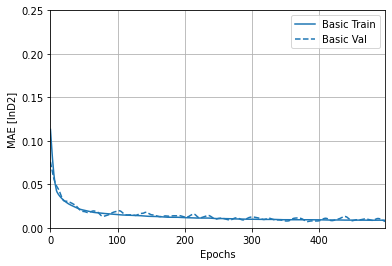

In [50]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 0.25])
plt.ylabel('MAE [lnD2]')

Text(0, 0.5, 'MSE [lnD2^2]')

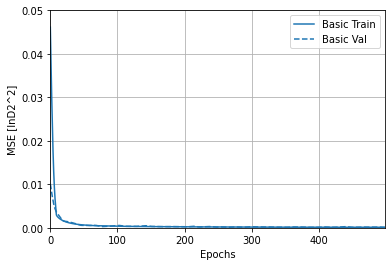

In [51]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 0.05])
plt.ylabel('MSE [lnD2^2]')

In [52]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [53]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [lnD2]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [lnD2]\')'

In [54]:
loss, mae, mse = model.evaluate(normed_test_data_lnD2, test_labels_lnD2, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} lnD2".format(mae))

26/26 - 0s - loss: 5.5388e-05 - mae: 0.0053 - mse: 5.5388e-05
Testing set Mean Abs Error:  0.01 lnD2


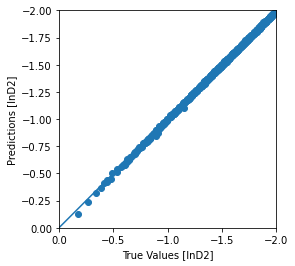

In [55]:
test_predictions_lnD2 = model.predict(normed_test_data_lnD2).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_lnD2, test_predictions_lnD2)
plt.xlabel('True Values [lnD2]')
plt.ylabel('Predictions [lnD2]')
lims = [0, -2]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("lnD2_ANN.png")
#files.download("lnD2_ANN.png")

In [56]:
fig = px.scatter(x=test_labels_lnD2, y=test_predictions_lnD2, title="Actual vs Predicted lnD2")
fig.show()

In [57]:
plt.savefig("abc.png")
#files.download("abc.png")

<Figure size 432x288 with 0 Axes>

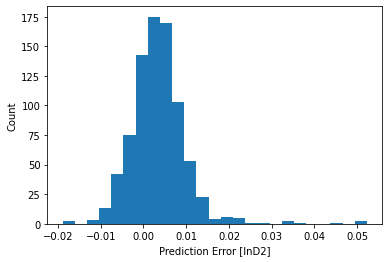

In [58]:
error_lnD2 = test_predictions_lnD2 - test_labels_lnD2
plt.hist(error_lnD2, bins = 25)
plt.xlabel("Prediction Error [lnD2]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png")

In [59]:
fig = px.histogram(error_lnD2, title='Histogram of Prediction Errors of lnD2', labels = {'lnD2' : 'error_lnD2'})
fig.show()

# Model for D3

In [60]:
dataset_lnD3 = pavement_data.drop(['lnD1', 'lnD2', 'lnD4', 'lnD5', 'lnD6'], axis =1)
dataset_lnD3

,H1,H2,lnD3,E1,E2,E3,SN
0,74,351,-2.198676,7621,340,160,0.295591
1,97,226,-2.305690,1517,494,190,0.141169
2,220,287,-1.731662,1356,209,100,0.147625
3,60,538,-1.879870,7492,239,105,0.405743
4,40,578,-2.112957,7074,499,119,0.298245
...,...,...,...,...,...,...,...
5020,155,373,-0.892306,1601,293,33,0.300245
5021,65,234,-0.719286,1822,396,36,0.461535
5022,151,231,-0.920399,6324,227,39,0.479972
5023,96,336,-0.904609,3565,388,35,0.440157


In [61]:
train_dataset_lnD3 = dataset_lnD3.iloc[:4200,:]
test_dataset_lnD3 = dataset_lnD3.iloc[4200:,:]
train_dataset_lnD3

,H1,H2,lnD3,E1,E2,E3,SN
0,74,351,-2.198676,7621,340,160,0.295591
1,97,226,-2.305690,1517,494,190,0.141169
2,220,287,-1.731662,1356,209,100,0.147625
3,60,538,-1.879870,7492,239,105,0.405743
4,40,578,-2.112957,7074,499,119,0.298245
...,...,...,...,...,...,...,...
4195,120,366,-1.746863,5689,356,92,0.270546
4196,147,402,-2.058541,7934,418,122,0.218286
4197,43,419,-1.804298,8342,247,103,0.505022
4198,199,421,-1.838034,4539,175,108,0.186703


In [62]:
test_dataset_lnD3

,H1,H2,lnD3,E1,E2,E3,SN
4200,190,374,-2.092567,5358,437,124,0.170066
4201,68,241,-2.159611,2531,157,160,0.274840
4202,176,593,-2.263653,4996,462,132,0.149620
4203,145,205,-2.360532,6429,490,198,0.176629
4204,50,344,-2.156063,6762,157,158,0.467783
...,...,...,...,...,...,...,...
5020,155,373,-0.892306,1601,293,33,0.300245
5021,65,234,-0.719286,1822,396,36,0.461535
5022,151,231,-0.920399,6324,227,39,0.479972
5023,96,336,-0.904609,3565,388,35,0.440157


In [63]:
train_stats_lnD3 = train_dataset_lnD3.describe()
train_stats_lnD3.pop("lnD3")
train_stats_lnD3 = train_stats_lnD3.transpose()
train_stats_lnD3

,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.00000,93.000000,143.000000,198.000000,250.00000
H2,4200.0,374.573810,130.960577,150.00000,261.000000,375.000000,487.000000,600.00000
E1,4200.0,4787.385714,2181.197623,1005.00000,2906.500000,4815.000000,6668.000000,8531.00000
E2,4200.0,324.662619,101.618712,150.00000,237.000000,327.500000,411.000000,500.00000
E3,4200.0,114.691667,49.281699,30.00000,72.000000,116.000000,157.000000,200.00000
SN,4200.0,0.250216,0.114627,0.08963,0.166944,0.220692,0.300785,1.08405


In [64]:
train_labels_lnD3 = train_dataset_lnD3.pop('lnD3')
test_labels_lnD3 = test_dataset_lnD3.pop('lnD3')

In [65]:
train_dataset_lnD3

,H1,H2,E1,E2,E3,SN
0,74,351,7621,340,160,0.295591
1,97,226,1517,494,190,0.141169
2,220,287,1356,209,100,0.147625
3,60,538,7492,239,105,0.405743
4,40,578,7074,499,119,0.298245
...,...,...,...,...,...,...
4195,120,366,5689,356,92,0.270546
4196,147,402,7934,418,122,0.218286
4197,43,419,8342,247,103,0.505022
4198,199,421,4539,175,108,0.186703


In [66]:
test_dataset_lnD3

,H1,H2,E1,E2,E3,SN
4200,190,374,5358,437,124,0.170066
4201,68,241,2531,157,160,0.274840
4202,176,593,4996,462,132,0.149620
4203,145,205,6429,490,198,0.176629
4204,50,344,6762,157,158,0.467783
...,...,...,...,...,...,...
5020,155,373,1601,293,33,0.300245
5021,65,234,1822,396,36,0.461535
5022,151,231,6324,227,39,0.479972
5023,96,336,3565,388,35,0.440157


In [67]:
def norm(x):
  return (x - train_stats_lnD3['mean']) / train_stats_lnD3['std']
normed_train_data_lnD3 = norm(train_dataset_lnD3)
normed_test_data_lnD3 = norm(test_dataset_lnD3)

In [68]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_lnD3.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [69]:
model = build_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 64)                448       
_________________________________________________________________
dense_10 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 65        
Total params: 4,673
Trainable params: 4,673
Non-trainable params: 0
_________________________________________________________________


In [70]:
example_batch = normed_train_data_lnD3[:10]
example_result = model.predict(example_batch)
example_result

array([[-0.09780718],
       [-0.3325081 ],
       [ 0.09346602],
       [-0.25629488],
       [ 0.06922938],
       [-0.04293518],
       [-0.64067644],
       [ 0.0755367 ],
       [-0.33937865],
       [ 0.03157367]], dtype=float32)

In [71]:
EPOCHS = 500

history = model.fit(
  normed_train_data_lnD3, train_labels_lnD3,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.2965,  mae:0.3722,  mse:0.2965,  val_loss:0.0491,  val_mae:0.1722,  val_mse:0.0491,  
....................................................................................................
Epoch: 100, loss:0.0006,  mae:0.0198,  mse:0.0006,  val_loss:0.0001,  val_mae:0.0083,  val_mse:0.0001,  
....................................................................................................
Epoch: 200, loss:0.0003,  mae:0.0140,  mse:0.0003,  val_loss:0.0004,  val_mae:0.0184,  val_mse:0.0004,  
....................................................................................................
Epoch: 300, loss:0.0002,  mae:0.0119,  mse:0.0002,  val_loss:0.0003,  val_mae:0.0145,  val_mse:0.0003,  
....................................................................................................
Epoch: 400, loss:0.0002,  mae:0.0111,  mse:0.0002,  val_loss:0.0001,  val_mae:0.0092,  val_mse:0.0001,  
........................................................................

In [72]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,0.296489,0.372204,0.296489,0.049107,0.172191,0.049107,0
1,0.022608,0.118493,0.022608,0.008291,0.070455,0.008291,1
2,0.009484,0.077252,0.009484,0.004124,0.050255,0.004124,2
3,0.006560,0.063466,0.006560,0.004132,0.050080,0.004132,3
4,0.006001,0.060336,0.006001,0.002828,0.042370,0.002828,4


In [73]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [lnD3]')

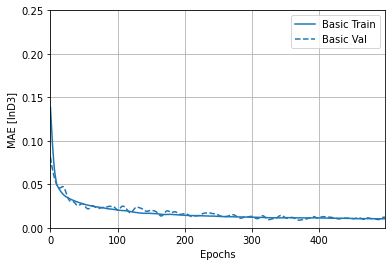

In [74]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 0.25])
plt.ylabel('MAE [lnD3]')

Text(0, 0.5, 'MSE [lnD3^2]')

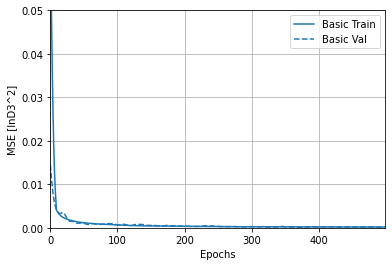

In [75]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 0.05])
plt.ylabel('MSE [lnD3^2]')

In [76]:
loss, mae, mse = model.evaluate(normed_test_data_lnD3, test_labels_lnD3, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} lnD3".format(mae))

26/26 - 0s - loss: 8.2124e-05 - mae: 0.0070 - mse: 8.2124e-05
Testing set Mean Abs Error:  0.01 lnD3


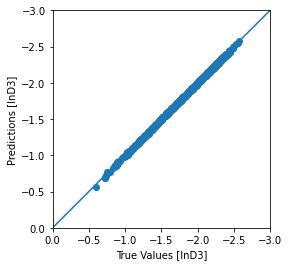

In [77]:
test_predictions_lnD3 = model.predict(normed_test_data_lnD3).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_lnD3, test_predictions_lnD3)
plt.xlabel('True Values [lnD3]')
plt.ylabel('Predictions [lnD3]')
lims = [0, -3]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("lnD3_ANN.png")
#files.download("lnD3_ANN.png") 


In [78]:
fig = px.scatter(x=test_labels_lnD3, y=test_predictions_lnD3, title="Actual vs Predicted lnD3")
fig.show()

In [79]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

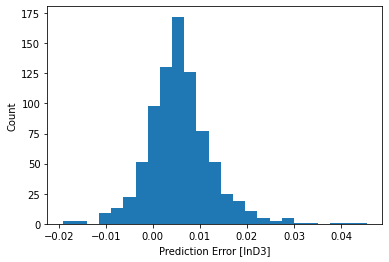

In [80]:
error_lnD3 = test_predictions_lnD3 - test_labels_lnD3
plt.hist(error_lnD3, bins = 25)
plt.xlabel("Prediction Error [lnD3]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 

In [81]:
fig = px.histogram(error_lnD3, title='Histogram of Prediction Errors of lnD3', labels = {'lnD3' : 'error_lnD3'})
fig.show()

# Model for D4

In [82]:
dataset_lnD4 = pavement_data.drop(['lnD1', 'lnD2', 'lnD3', 'lnD5', 'lnD6'], axis =1)
dataset_lnD4

,H1,H2,lnD4,E1,E2,E3,SN
0,74,351,-2.418894,7621,340,160,0.295591
1,97,226,-2.545039,1517,494,190,0.141169
2,220,287,-1.971413,1356,209,100,0.147625
3,60,538,-2.063017,7492,239,105,0.405743
4,40,578,-2.270118,7074,499,119,0.298245
...,...,...,...,...,...,...,...
5020,155,373,-1.044493,1601,293,33,0.300245
5021,65,234,-1.046855,1822,396,36,0.461535
5022,151,231,-1.115901,6324,227,39,0.479972
5023,96,336,-1.067172,3565,388,35,0.440157


In [83]:
train_dataset_lnD4 = dataset_lnD4.iloc[:4200,:]
test_dataset_lnD4 = dataset_lnD4.iloc[4200:,:]
train_dataset_lnD4

,H1,H2,lnD4,E1,E2,E3,SN
0,74,351,-2.418894,7621,340,160,0.295591
1,97,226,-2.545039,1517,494,190,0.141169
2,220,287,-1.971413,1356,209,100,0.147625
3,60,538,-2.063017,7492,239,105,0.405743
4,40,578,-2.270118,7074,499,119,0.298245
...,...,...,...,...,...,...,...
4195,120,366,-1.956233,5689,356,92,0.270546
4196,147,402,-2.264904,7934,418,122,0.218286
4197,43,419,-2.002258,8342,247,103,0.505022
4198,199,421,-2.076326,4539,175,108,0.186703


In [84]:
test_dataset_lnD4

,H1,H2,lnD4,E1,E2,E3,SN
4200,190,374,-2.291250,5358,437,124,0.170066
4201,68,241,-2.787743,2531,157,160,0.274840
4202,176,593,-2.441387,4996,462,132,0.149620
4203,145,205,-2.622377,6429,490,198,0.176629
4204,50,344,-2.786931,6762,157,158,0.467783
...,...,...,...,...,...,...,...
5020,155,373,-1.044493,1601,293,33,0.300245
5021,65,234,-1.046855,1822,396,36,0.461535
5022,151,231,-1.115901,6324,227,39,0.479972
5023,96,336,-1.067172,3565,388,35,0.440157


In [85]:
train_stats_lnD4 = train_dataset_lnD4.describe()
train_stats_lnD4.pop("lnD4")
train_stats_lnD4 = train_stats_lnD4.transpose()
train_stats_lnD4

,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.00000,93.000000,143.000000,198.000000,250.00000
H2,4200.0,374.573810,130.960577,150.00000,261.000000,375.000000,487.000000,600.00000
E1,4200.0,4787.385714,2181.197623,1005.00000,2906.500000,4815.000000,6668.000000,8531.00000
E2,4200.0,324.662619,101.618712,150.00000,237.000000,327.500000,411.000000,500.00000
E3,4200.0,114.691667,49.281699,30.00000,72.000000,116.000000,157.000000,200.00000
SN,4200.0,0.250216,0.114627,0.08963,0.166944,0.220692,0.300785,1.08405


In [86]:
train_labels_lnD4 = train_dataset_lnD4.pop('lnD4')
test_labels_lnD4 = test_dataset_lnD4.pop('lnD4')

In [87]:
train_dataset_lnD4

,H1,H2,E1,E2,E3,SN
0,74,351,7621,340,160,0.295591
1,97,226,1517,494,190,0.141169
2,220,287,1356,209,100,0.147625
3,60,538,7492,239,105,0.405743
4,40,578,7074,499,119,0.298245
...,...,...,...,...,...,...
4195,120,366,5689,356,92,0.270546
4196,147,402,7934,418,122,0.218286
4197,43,419,8342,247,103,0.505022
4198,199,421,4539,175,108,0.186703


In [88]:
test_dataset_lnD4

,H1,H2,E1,E2,E3,SN
4200,190,374,5358,437,124,0.170066
4201,68,241,2531,157,160,0.274840
4202,176,593,4996,462,132,0.149620
4203,145,205,6429,490,198,0.176629
4204,50,344,6762,157,158,0.467783
...,...,...,...,...,...,...
5020,155,373,1601,293,33,0.300245
5021,65,234,1822,396,36,0.461535
5022,151,231,6324,227,39,0.479972
5023,96,336,3565,388,35,0.440157


In [89]:
def norm(x):
  return (x - train_stats_lnD4['mean']) / train_stats_lnD4['std']
normed_train_data_lnD4 = norm(train_dataset_lnD4)
normed_test_data_lnD4 = norm(test_dataset_lnD4)

In [90]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_lnD4.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [91]:
model = build_model()

In [92]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 64)                448       
_________________________________________________________________
dense_13 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 65        
Total params: 4,673
Trainable params: 4,673
Non-trainable params: 0
_________________________________________________________________


In [93]:
example_batch = normed_train_data_lnD4[:10]
example_result = model.predict(example_batch)
example_result

array([[-0.5023512 ],
       [-1.1131002 ],
       [-0.502397  ],
       [-0.18153217],
       [-0.47054797],
       [-0.3004267 ],
       [-0.11615115],
       [-0.3169695 ],
       [ 0.02918673],
       [-0.36869177]], dtype=float32)

In [94]:
EPOCHS = 500

history = model.fit(
  normed_train_data_lnD4, train_labels_lnD4,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.2241,  mae:0.3447,  mse:0.2241,  val_loss:0.0598,  val_mae:0.1910,  val_mse:0.0598,  
....................................................................................................
Epoch: 100, loss:0.0013,  mae:0.0268,  mse:0.0013,  val_loss:0.0013,  val_mae:0.0187,  val_mse:0.0013,  
....................................................................................................
Epoch: 200, loss:0.0008,  mae:0.0191,  mse:0.0008,  val_loss:0.0014,  val_mae:0.0230,  val_mse:0.0014,  
....................................................................................................
Epoch: 300, loss:0.0005,  mae:0.0164,  mse:0.0005,  val_loss:0.0010,  val_mae:0.0154,  val_mse:0.0010,  
....................................................................................................
Epoch: 400, loss:0.0005,  mae:0.0155,  mse:0.0005,  val_loss:0.0010,  val_mae:0.0133,  val_mse:0.0010,  
........................................................................

In [95]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,0.224145,0.344654,0.224145,0.059805,0.190969,0.059805,0
1,0.036378,0.149317,0.036378,0.020709,0.111171,0.020709,1
2,0.015226,0.096281,0.015226,0.018013,0.111313,0.018013,2
3,0.010586,0.080861,0.010586,0.007491,0.064866,0.007491,3
4,0.009204,0.074440,0.009204,0.006919,0.063376,0.006919,4


Text(0, 0.5, 'MAE [lnD4]')

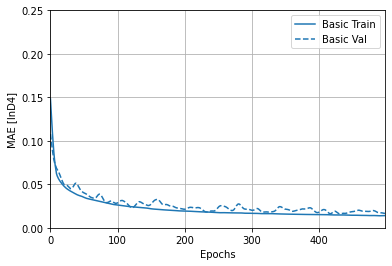

In [96]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 0.25])
plt.ylabel('MAE [lnD4]')

Text(0, 0.5, 'MSE [lnD4^2]')

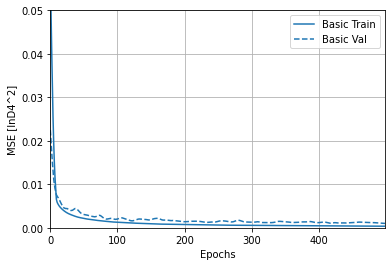

In [97]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 0.05])
plt.ylabel('MSE [lnD4^2]')

In [98]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [99]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [lnD4]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [lnD4]\')'

In [100]:
loss, mae, mse = model.evaluate(normed_test_data_lnD4, test_labels_lnD4, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} lnD4".format(mae))

26/26 - 0s - loss: 5.6247e-04 - mae: 0.0139 - mse: 5.6247e-04
Testing set Mean Abs Error:  0.01 lnD4


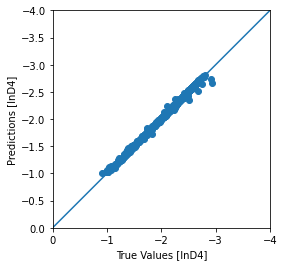

In [101]:
test_predictions_lnD4 = model.predict(normed_test_data_lnD4).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_lnD4, test_predictions_lnD4)
plt.xlabel('True Values [lnD4]')
plt.ylabel('Predictions [lnD4]')
lims = [0, -4]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("lnD4_ANN.png")
#files.download("lnD4_ANN.png") 


In [102]:
fig = px.scatter(x=test_labels_lnD4, y=test_predictions_lnD4, title="Actual vs Predicted lnD4")
fig.show()

In [103]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

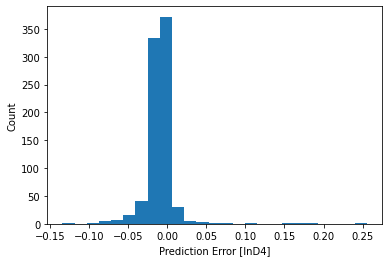

In [104]:
error_lnD4 = test_predictions_lnD4 - test_labels_lnD4
plt.hist(error_lnD4, bins = 25)
plt.xlabel("Prediction Error [lnD4]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [105]:
fig = px.histogram(error_lnD4, title='Histogram of Prediction Errors of lnD4', labels = {'lnD4' : 'error_lnD4'})
fig.show()

# Model for D5

In [106]:
dataset_lnD5 = pavement_data.drop(['lnD1', 'lnD2', 'lnD3', 'lnD4', 'lnD6'], axis =1)
dataset_lnD5

,H1,H2,lnD5,E1,E2,E3,SN
0,74,351,-2.975538,7621,340,160,0.295591
1,97,226,-3.146323,1517,494,190,0.141169
2,220,287,-2.411285,1356,209,100,0.147625
3,60,538,-2.561356,7492,239,105,0.405743
4,40,578,-2.635404,7074,499,119,0.298245
...,...,...,...,...,...,...,...
5020,155,373,-1.299603,1601,293,33,0.300245
5021,65,234,-1.306892,1822,396,36,0.461535
5022,151,231,-1.402830,6324,227,39,0.479972
5023,96,336,-1.338648,3565,388,35,0.440157


In [107]:
train_dataset_lnD5 = dataset_lnD5.iloc[:4200,:]
test_dataset_lnD5 = dataset_lnD5.iloc[4200:,:]
train_dataset_lnD5

,H1,H2,lnD5,E1,E2,E3,SN
0,74,351,-2.975538,7621,340,160,0.295591
1,97,226,-3.146323,1517,494,190,0.141169
2,220,287,-2.411285,1356,209,100,0.147625
3,60,538,-2.561356,7492,239,105,0.405743
4,40,578,-2.635404,7074,499,119,0.298245
...,...,...,...,...,...,...,...
4195,120,366,-2.329545,5689,356,92,0.270546
4196,147,402,-2.572558,7934,418,122,0.218286
4197,43,419,-2.535653,8342,247,103,0.505022
4198,199,421,-2.455969,4539,175,108,0.186703


In [108]:
test_dataset_lnD5

,H1,H2,lnD5,E1,E2,E3,SN
4200,190,374,-2.580977,5358,437,124,0.170066
4201,68,241,-3.166758,2531,157,160,0.274840
4202,176,593,-2.716435,4996,462,132,0.149620
4203,145,205,-3.108453,6429,490,198,0.176629
4204,50,344,-2.746531,6762,157,158,0.467783
...,...,...,...,...,...,...,...
5020,155,373,-1.299603,1601,293,33,0.300245
5021,65,234,-1.306892,1822,396,36,0.461535
5022,151,231,-1.402830,6324,227,39,0.479972
5023,96,336,-1.338648,3565,388,35,0.440157


In [109]:
train_stats_lnD5 = train_dataset_lnD5.describe()
train_stats_lnD5.pop("lnD5")
train_stats_lnD5 = train_stats_lnD5.transpose()
train_stats_lnD5


,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.00000,93.000000,143.000000,198.000000,250.00000
H2,4200.0,374.573810,130.960577,150.00000,261.000000,375.000000,487.000000,600.00000
E1,4200.0,4787.385714,2181.197623,1005.00000,2906.500000,4815.000000,6668.000000,8531.00000
E2,4200.0,324.662619,101.618712,150.00000,237.000000,327.500000,411.000000,500.00000
E3,4200.0,114.691667,49.281699,30.00000,72.000000,116.000000,157.000000,200.00000
SN,4200.0,0.250216,0.114627,0.08963,0.166944,0.220692,0.300785,1.08405


In [110]:
train_labels_lnD5 = train_dataset_lnD5.pop('lnD5')
test_labels_lnD5 = test_dataset_lnD5.pop('lnD5')

In [111]:
train_dataset_lnD5

,H1,H2,E1,E2,E3,SN
0,74,351,7621,340,160,0.295591
1,97,226,1517,494,190,0.141169
2,220,287,1356,209,100,0.147625
3,60,538,7492,239,105,0.405743
4,40,578,7074,499,119,0.298245
...,...,...,...,...,...,...
4195,120,366,5689,356,92,0.270546
4196,147,402,7934,418,122,0.218286
4197,43,419,8342,247,103,0.505022
4198,199,421,4539,175,108,0.186703


In [112]:
def norm(x):
  return (x - train_stats_lnD5['mean']) / train_stats_lnD5['std']
normed_train_data_lnD5 = norm(train_dataset_lnD5)
normed_test_data_lnD5 = norm(test_dataset_lnD5)

In [113]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_lnD5.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [114]:
model = build_model()

In [115]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 64)                448       
_________________________________________________________________
dense_16 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 65        
Total params: 4,673
Trainable params: 4,673
Non-trainable params: 0
_________________________________________________________________


In [116]:
example_batch = normed_train_data_lnD5[:10]
example_result = model.predict(example_batch)
example_result

array([[ 0.06030064],
       [ 0.6100938 ],
       [ 0.35883385],
       [ 0.14134629],
       [ 0.5569637 ],
       [ 0.37543765],
       [-0.17114264],
       [ 0.14998806],
       [ 0.19112906],
       [ 0.31093958]], dtype=float32)

In [117]:
EPOCHS = 500

history = model.fit(
  normed_train_data_lnD5, train_labels_lnD5,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.8800,  mae:0.6444,  mse:0.8800,  val_loss:0.0961,  val_mae:0.2445,  val_mse:0.0961,  
....................................................................................................
Epoch: 100, loss:0.0013,  mae:0.0276,  mse:0.0013,  val_loss:0.0004,  val_mae:0.0147,  val_mse:0.0004,  
....................................................................................................
Epoch: 200, loss:0.0007,  mae:0.0208,  mse:0.0007,  val_loss:0.0003,  val_mae:0.0113,  val_mse:0.0003,  
....................................................................................................
Epoch: 300, loss:0.0005,  mae:0.0181,  mse:0.0005,  val_loss:0.0007,  val_mae:0.0213,  val_mse:0.0007,  
....................................................................................................
Epoch: 400, loss:0.0004,  mae:0.0156,  mse:0.0004,  val_loss:0.0010,  val_mae:0.0285,  val_mse:0.0010,  
........................................................................

In [118]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,0.879984,0.644379,0.879984,0.096112,0.244538,0.096112,0
1,0.047469,0.168718,0.047469,0.025557,0.122614,0.025557,1
2,0.017109,0.100848,0.017109,0.010809,0.080269,0.010809,2
3,0.011662,0.083587,0.011662,0.015946,0.110625,0.015946,3
4,0.009107,0.074145,0.009107,0.008817,0.073658,0.008817,4


In [119]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [lnD5]')

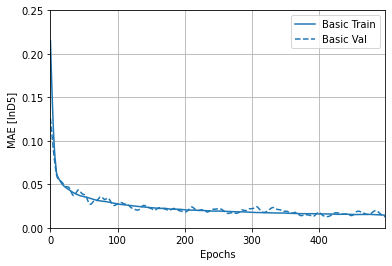

In [120]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 0.25])
plt.ylabel('MAE [lnD5]')

Text(0, 0.5, 'MSE [lnD5^2]')

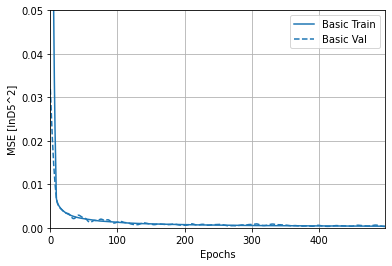

In [121]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 0.05])
plt.ylabel('MSE [lnD5^2]')

In [122]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [123]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [lnD5]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [lnD5]\')'

In [124]:
loss, mae, mse = model.evaluate(normed_test_data_lnD5, test_labels_lnD5, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} lnD5".format(mae))

26/26 - 0s - loss: 8.6164e-04 - mae: 0.0162 - mse: 8.6164e-04
Testing set Mean Abs Error:  0.02 lnD5


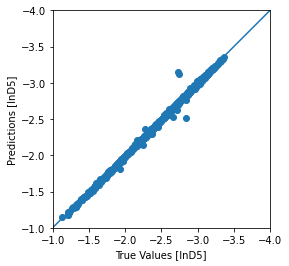

In [125]:
test_predictions_lnD5 = model.predict(normed_test_data_lnD5).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_lnD5, test_predictions_lnD5)
plt.xlabel('True Values [lnD5]')
plt.ylabel('Predictions [lnD5]')
lims = [-1, -4]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("lnD5_ANN.png")
#files.download("lnD5_ANN.png") 


In [126]:
fig = px.scatter(x=test_labels_lnD5, y=test_predictions_lnD5, title="Actual vs Predicted lnD5")
fig.show()

In [127]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

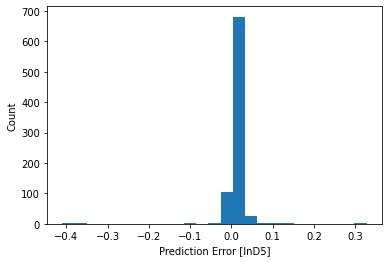

In [128]:
error_lnD5 = test_predictions_lnD5 - test_labels_lnD5
plt.hist(error_lnD5, bins = 25)
plt.xlabel("Prediction Error [lnD5]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [129]:
fig = px.histogram(error_lnD5, title='Histogram of Prediction Errors of lnD5', labels = {'lnD5' : 'error_lnD5'})
fig.show()

# Model for D6

In [130]:
dataset_lnD6 = pavement_data.drop(['lnD1', 'lnD2', 'lnD3', 'lnD4', 'lnD5'], axis =1)
dataset_lnD6

,H1,H2,lnD6,E1,E2,E3,SN
0,74,351,-3.105324,7621,340,160,0.295591
1,97,226,-3.273596,1517,494,190,0.141169
2,220,287,-2.599241,1356,209,100,0.147625
3,60,538,-2.676116,7492,239,105,0.405743
4,40,578,-2.831575,7074,499,119,0.298245
...,...,...,...,...,...,...,...
5020,155,373,-1.460113,1601,293,33,0.300245
5021,65,234,-1.502873,1822,396,36,0.461535
5022,151,231,-1.606592,6324,227,39,0.479972
5023,96,336,-1.509095,3565,388,35,0.440157


In [131]:
train_dataset_lnD6 = dataset_lnD6.iloc[:4200,:]
test_dataset_lnD6 = dataset_lnD6.iloc[4200:,:]
train_dataset_lnD6

,H1,H2,lnD6,E1,E2,E3,SN
0,74,351,-3.105324,7621,340,160,0.295591
1,97,226,-3.273596,1517,494,190,0.141169
2,220,287,-2.599241,1356,209,100,0.147625
3,60,538,-2.676116,7492,239,105,0.405743
4,40,578,-2.831575,7074,499,119,0.298245
...,...,...,...,...,...,...,...
4195,120,366,-2.508626,5689,356,92,0.270546
4196,147,402,-2.835145,7934,418,122,0.218286
4197,43,419,-2.654699,8342,247,103,0.505022
4198,199,421,-2.713415,4539,175,108,0.186703


In [132]:
test_dataset_lnD6

,H1,H2,lnD6,E1,E2,E3,SN
4200,190,374,-2.833103,5358,437,124,0.170066
4201,68,241,-3.047447,2531,157,160,0.274840
4202,176,593,-2.942381,4996,462,132,0.149620
4203,145,205,-3.389071,6429,490,198,0.176629
4204,50,344,-3.043034,6762,157,158,0.467783
...,...,...,...,...,...,...,...
5020,155,373,-1.460113,1601,293,33,0.300245
5021,65,234,-1.502873,1822,396,36,0.461535
5022,151,231,-1.606592,6324,227,39,0.479972
5023,96,336,-1.509095,3565,388,35,0.440157


In [133]:
train_stats_lnD6 = train_dataset_lnD6.describe()
train_stats_lnD6.pop("lnD6")
train_stats_lnD6 = train_stats_lnD6.transpose()
train_stats_lnD6


,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.00000,93.000000,143.000000,198.000000,250.00000
H2,4200.0,374.573810,130.960577,150.00000,261.000000,375.000000,487.000000,600.00000
E1,4200.0,4787.385714,2181.197623,1005.00000,2906.500000,4815.000000,6668.000000,8531.00000
E2,4200.0,324.662619,101.618712,150.00000,237.000000,327.500000,411.000000,500.00000
E3,4200.0,114.691667,49.281699,30.00000,72.000000,116.000000,157.000000,200.00000
SN,4200.0,0.250216,0.114627,0.08963,0.166944,0.220692,0.300785,1.08405


In [134]:
train_labels_lnD6 = train_dataset_lnD6.pop('lnD6')
test_labels_lnD6 = test_dataset_lnD6.pop('lnD6')

In [135]:
train_dataset_lnD6

,H1,H2,E1,E2,E3,SN
0,74,351,7621,340,160,0.295591
1,97,226,1517,494,190,0.141169
2,220,287,1356,209,100,0.147625
3,60,538,7492,239,105,0.405743
4,40,578,7074,499,119,0.298245
...,...,...,...,...,...,...
4195,120,366,5689,356,92,0.270546
4196,147,402,7934,418,122,0.218286
4197,43,419,8342,247,103,0.505022
4198,199,421,4539,175,108,0.186703


In [136]:
test_dataset_lnD6

,H1,H2,E1,E2,E3,SN
4200,190,374,5358,437,124,0.170066
4201,68,241,2531,157,160,0.274840
4202,176,593,4996,462,132,0.149620
4203,145,205,6429,490,198,0.176629
4204,50,344,6762,157,158,0.467783
...,...,...,...,...,...,...
5020,155,373,1601,293,33,0.300245
5021,65,234,1822,396,36,0.461535
5022,151,231,6324,227,39,0.479972
5023,96,336,3565,388,35,0.440157


In [137]:
def norm(x):
  return (x - train_stats_lnD6['mean']) / train_stats_lnD6['std']
normed_train_data_lnD6 = norm(train_dataset_lnD6)
normed_test_data_lnD6 = norm(test_dataset_lnD6)

In [138]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_lnD6.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [139]:
model = build_model()

In [140]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 64)                448       
_________________________________________________________________
dense_19 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 65        
Total params: 4,673
Trainable params: 4,673
Non-trainable params: 0
_________________________________________________________________


In [141]:
example_batch = normed_train_data_lnD6[:10]
example_result = model.predict(example_batch)
example_result

array([[-0.11479367],
       [-0.4463284 ],
       [-0.839548  ],
       [-0.626576  ],
       [-0.29295853],
       [-0.4713726 ],
       [-0.39706603],
       [-0.59529424],
       [-0.6228807 ],
       [-0.2801835 ]], dtype=float32)

In [142]:
EPOCHS = 500

history = model.fit(
  normed_train_data_lnD6, train_labels_lnD6,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:0.6382,  mae:0.5677,  mse:0.6382,  val_loss:0.1087,  val_mae:0.2591,  val_mse:0.1087,  
....................................................................................................
Epoch: 100, loss:0.0012,  mae:0.0268,  mse:0.0012,  val_loss:0.0012,  val_mae:0.0279,  val_mse:0.0012,  
....................................................................................................
Epoch: 200, loss:0.0008,  mae:0.0221,  mse:0.0008,  val_loss:0.0005,  val_mae:0.0166,  val_mse:0.0005,  
....................................................................................................
Epoch: 300, loss:0.0006,  mae:0.0195,  mse:0.0006,  val_loss:0.0006,  val_mae:0.0182,  val_mse:0.0006,  
....................................................................................................
Epoch: 400, loss:0.0005,  mae:0.0173,  mse:0.0005,  val_loss:0.0003,  val_mae:0.0126,  val_mse:0.0003,  
........................................................................

In [143]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,0.638238,0.567733,0.638238,0.108651,0.259051,0.108651,0
1,0.059968,0.191689,0.059968,0.030595,0.138358,0.030595,1
2,0.019885,0.110672,0.019885,0.026426,0.142337,0.026426,2
3,0.012562,0.088986,0.012562,0.006302,0.061003,0.006302,3
4,0.010495,0.079949,0.010495,0.004427,0.052263,0.004427,4


In [144]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [lnD6]')

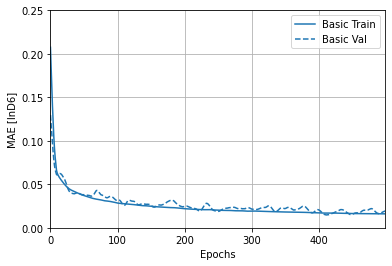

In [145]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 0.25])
plt.ylabel('MAE [lnD6]')

Text(0, 0.5, 'MSE [lnD6^2]')

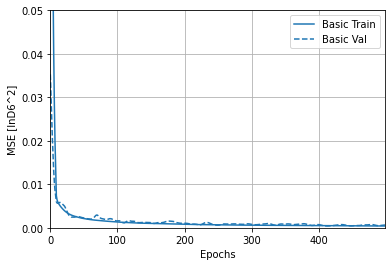

In [146]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 0.05])
plt.ylabel('MSE [lnD6^2]')

In [147]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [148]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [lnD6]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [lnD6]\')'

In [149]:
loss, mae, mse = model.evaluate(normed_test_data_lnD6, test_labels_lnD6, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} lnD6".format(mae))

26/26 - 0s - loss: 4.8937e-04 - mae: 0.0170 - mse: 4.8937e-04
Testing set Mean Abs Error:  0.02 lnD6


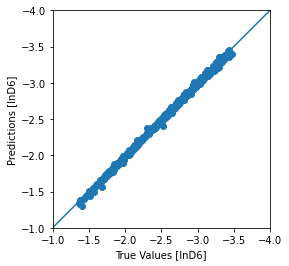

In [150]:
test_predictions_lnD6 = model.predict(normed_test_data_lnD6).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_lnD6, test_predictions_lnD6)
plt.xlabel('True Values [lnD6]')
plt.ylabel('Predictions [lnD6]')
lims = [-1, -4]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("lnD6_ANN.png")
#files.download("lnD6_ANN.png") 


In [151]:
fig = px.scatter(x=test_labels_lnD6, y=test_predictions_lnD6, title="Actual vs Predicted lnD6")
fig.show()

In [152]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

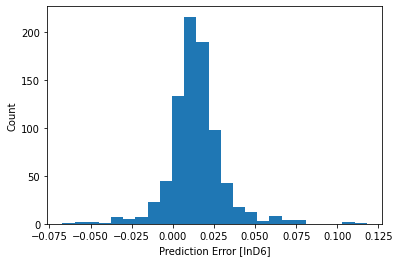

In [153]:
error_lnD6 = test_predictions_lnD6 - test_labels_lnD6
plt.hist(error_lnD6, bins = 25)
plt.xlabel("Prediction Error [lnD6]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [154]:
fig = px.histogram(error_lnD6, title='Histogram of Prediction Errors of lnD6', labels = {'lnD6' : 'error_lnD6'})
fig.show()

For E1 to E3, D1, D2, D3, D4, D5, D6 and H1 and H2 are inputs
So training dataset should contain only these variables.

# Model for E1

In [155]:
dataset_E1 = pavement_data.drop(['E2', 'E3'], axis =1)
dataset_E1

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E1,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,7621,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,1517,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,1356,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,7492,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,7074,0.298245
...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,1601,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,1822,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,6324,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,3565,0.440157


In [156]:
train_dataset_E1 = dataset_E1.iloc[:4200,:]
test_dataset_E1 = dataset_E1.iloc[4200:,:]
train_dataset_E1

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E1,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,7621,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,1517,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,1356,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,7492,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,7074,0.298245
...,...,...,...,...,...,...,...,...,...,...
4195,120,366,-1.073354,-1.388016,-1.746863,-1.956233,-2.329545,-2.508626,5689,0.270546
4196,147,402,-1.473160,-1.736987,-2.058541,-2.264904,-2.572558,-2.835145,7934,0.218286
4197,43,419,-0.565159,-1.277691,-1.804298,-2.002258,-2.535653,-2.654699,8342,0.505022
4198,199,421,-1.262803,-1.517588,-1.838034,-2.076326,-2.455969,-2.713415,4539,0.186703


In [157]:
test_dataset_E1

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E1,SN
4200,190,374,-1.540658,-1.802234,-2.092567,-2.291250,-2.580977,-2.833103,5358,0.170066
4201,68,241,-0.486637,-1.363438,-2.159611,-2.787743,-3.166758,-3.047447,2531,0.274840
4202,176,593,-1.630662,-1.946030,-2.263653,-2.441387,-2.716435,-2.942381,4996,0.149620
4203,145,205,-1.582115,-1.930815,-2.360532,-2.622377,-3.108453,-3.389071,6429,0.176629
4204,50,344,-0.489586,-1.344232,-2.156063,-2.786931,-2.746531,-3.043034,6762,0.467783
...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,1601,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,1822,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,6324,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,3565,0.440157


In [158]:
#sns.pairplot(train_dataset_E1[['E1',	'E2',	'E3',	'H1',	'H2',	'SN',	'E1']], diag_kind="kde")

In [159]:
train_stats_E1 = train_dataset_E1.describe()
train_stats_E1.pop("E1")
train_stats_E1 = train_stats_E1.transpose()
train_stats_E1


,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.000000,93.000000,143.000000,198.000000,250.000000
H2,4200.0,374.573810,130.960577,150.000000,261.000000,375.000000,487.000000,600.000000
lnD1,4200.0,-1.069338,0.406850,-2.066723,-1.363056,-1.084576,-0.788150,0.285735
lnD2,4200.0,-1.460927,0.384696,-2.319935,-1.742998,-1.516722,-1.221051,-0.097481
lnD3,4200.0,-1.845874,0.428074,-2.592269,-2.195841,-1.935480,-1.555637,-0.494985
lnD4,4200.0,-2.073457,0.438742,-3.085001,-2.432381,-2.170724,-1.776305,-0.848866
lnD5,4200.0,-2.457268,0.529674,-3.466696,-2.893356,-2.570399,-2.075589,-1.109208
lnD6,4200.0,-2.652965,0.537557,-3.471191,-3.109853,-2.772269,-2.273318,-1.329196
SN,4200.0,0.250216,0.114627,0.089630,0.166944,0.220692,0.300785,1.084050


In [160]:
train_labels_E1 = train_dataset_E1.pop('E1')
test_labels_E1 = test_dataset_E1.pop('E1')

In [161]:
train_dataset_E1

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,0.298245
...,...,...,...,...,...,...,...,...,...
4195,120,366,-1.073354,-1.388016,-1.746863,-1.956233,-2.329545,-2.508626,0.270546
4196,147,402,-1.473160,-1.736987,-2.058541,-2.264904,-2.572558,-2.835145,0.218286
4197,43,419,-0.565159,-1.277691,-1.804298,-2.002258,-2.535653,-2.654699,0.505022
4198,199,421,-1.262803,-1.517588,-1.838034,-2.076326,-2.455969,-2.713415,0.186703


In [162]:
test_dataset_E1

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,SN
4200,190,374,-1.540658,-1.802234,-2.092567,-2.291250,-2.580977,-2.833103,0.170066
4201,68,241,-0.486637,-1.363438,-2.159611,-2.787743,-3.166758,-3.047447,0.274840
4202,176,593,-1.630662,-1.946030,-2.263653,-2.441387,-2.716435,-2.942381,0.149620
4203,145,205,-1.582115,-1.930815,-2.360532,-2.622377,-3.108453,-3.389071,0.176629
4204,50,344,-0.489586,-1.344232,-2.156063,-2.786931,-2.746531,-3.043034,0.467783
...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,0.440157


In [163]:
def norm(x):
  return (x - train_stats_E1['mean']) / train_stats_E1['std']
normed_train_data_E1 = norm(train_dataset_E1)
normed_test_data_E1 = norm(test_dataset_E1)

In [164]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_E1.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [165]:
model = build_model()

In [166]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_21 (Dense)             (None, 64)                640       
_________________________________________________________________
dense_22 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 65        
Total params: 4,865
Trainable params: 4,865
Non-trainable params: 0
_________________________________________________________________


In [167]:
example_batch = normed_train_data_E1[:10]
example_result = model.predict(example_batch)
example_result

array([[-0.33449572],
       [-0.19147265],
       [-0.16845152],
       [-0.14241287],
       [-0.17445308],
       [-0.3528974 ],
       [ 0.07779935],
       [ 0.00718393],
       [ 0.3572362 ],
       [-0.40903914]], dtype=float32)

In [168]:
EPOCHS = 500

history = model.fit(
  normed_train_data_E1, train_labels_E1,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:27550756.0000,  mae:4769.0112,  mse:27550756.0000,  val_loss:27401294.0000,  val_mae:4781.3188,  val_mse:27401294.0000,  
....................................................................................................
Epoch: 100, loss:118897.5547,  mae:254.6910,  mse:118897.5547,  val_loss:110520.4219,  val_mae:255.0989,  val_mse:110520.4219,  
....................................................................................................
Epoch: 200, loss:41591.8555,  mae:146.1135,  mse:41591.8555,  val_loss:38809.1055,  val_mae:144.9833,  val_mse:38809.1055,  
....................................................................................................
Epoch: 300, loss:25960.8691,  mae:115.0002,  mse:25960.8691,  val_loss:28644.7539,  val_mae:119.2353,  val_mse:28644.7539,  
....................................................................................................
Epoch: 400, loss:17542.7734,  mae:91.3307,  mse:17542.7734,  val_loss:21555.894

In [169]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,27550756.0,4769.011230,27550756.0,27401294.0,4781.318848,27401294.0,0
1,26926032.0,4703.238770,26926032.0,26357116.0,4672.437988,26357116.0,1
2,25441838.0,4542.105957,25441838.0,24304408.0,4448.615234,24304408.0,2
3,22908862.0,4249.000000,22908862.0,21157922.0,4075.393799,21157922.0,3
4,19333878.0,3804.829346,19333878.0,17106266.0,3547.061279,17106266.0,4


In [170]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [E1]')

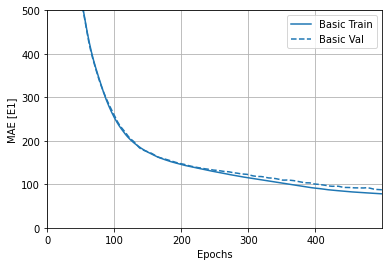

In [171]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 500])
plt.ylabel('MAE [E1]')

Text(0, 0.5, 'MSE [E1^2]')

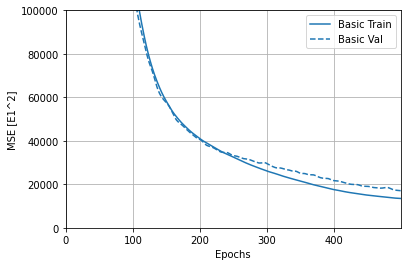

In [172]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 100000])
plt.ylabel('MSE [E1^2]')

In [173]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [174]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [E1]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [E1]\')'

In [175]:
loss, mae, mse = model.evaluate(normed_test_data_E1, test_labels_E1, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} E1".format(mae))

26/26 - 0s - loss: 17048.6719 - mae: 86.6276 - mse: 17048.6719
Testing set Mean Abs Error: 86.63 E1


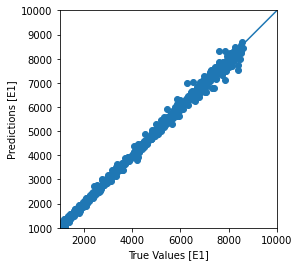

In [176]:
test_predictions_E1 = model.predict(normed_test_data_E1).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_E1, test_predictions_E1)
plt.xlabel('True Values [E1]')
plt.ylabel('Predictions [E1]')
lims = [1000, 10000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("E1_ANN.png")
#files.download("E1_ANN.png") 


In [177]:
fig = px.scatter(x=test_labels_E1, y=test_predictions_E1, title="Actual vs Predicted E1")
fig.show()

In [178]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

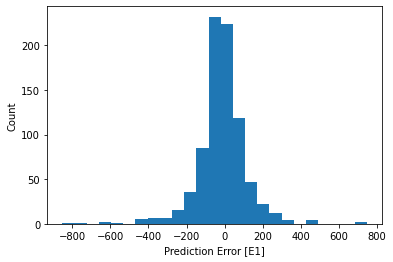

In [179]:
error_E1 = test_predictions_E1 - test_labels_E1
plt.hist(error_E1, bins = 25)
plt.xlabel("Prediction Error [E1]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [180]:
fig = px.histogram(error_E1, title='Histogram of Prediction Errors of E1', labels = {'E1' : 'error_E1'})
fig.show()

# Model for E2

In [181]:
dataset_E2 = pavement_data.drop(['E1', 'E3'], axis =1)
dataset_E2

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E2,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,340,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,494,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,209,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,239,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,499,0.298245
...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,293,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,396,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,227,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,388,0.440157


In [182]:
train_dataset_E2 = dataset_E2.iloc[:4200,:]
test_dataset_E2 = dataset_E2.iloc[4200:,:]
train_dataset_E2

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E2,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,340,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,494,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,209,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,239,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,499,0.298245
...,...,...,...,...,...,...,...,...,...,...
4195,120,366,-1.073354,-1.388016,-1.746863,-1.956233,-2.329545,-2.508626,356,0.270546
4196,147,402,-1.473160,-1.736987,-2.058541,-2.264904,-2.572558,-2.835145,418,0.218286
4197,43,419,-0.565159,-1.277691,-1.804298,-2.002258,-2.535653,-2.654699,247,0.505022
4198,199,421,-1.262803,-1.517588,-1.838034,-2.076326,-2.455969,-2.713415,175,0.186703


In [183]:
test_dataset_E2

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E2,SN
4200,190,374,-1.540658,-1.802234,-2.092567,-2.291250,-2.580977,-2.833103,437,0.170066
4201,68,241,-0.486637,-1.363438,-2.159611,-2.787743,-3.166758,-3.047447,157,0.274840
4202,176,593,-1.630662,-1.946030,-2.263653,-2.441387,-2.716435,-2.942381,462,0.149620
4203,145,205,-1.582115,-1.930815,-2.360532,-2.622377,-3.108453,-3.389071,490,0.176629
4204,50,344,-0.489586,-1.344232,-2.156063,-2.786931,-2.746531,-3.043034,157,0.467783
...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,293,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,396,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,227,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,388,0.440157


In [184]:
#sns.pairplot(train_dataset_E2[['E1',	'E2',	'E3',	'H1',	'H2',	'SN',	'E2']], diag_kind="kde")

In [185]:
train_stats_E2 = train_dataset_E2.describe()
train_stats_E2.pop("E2")
train_stats_E2 = train_stats_E2.transpose()
train_stats_E2


,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.000000,93.000000,143.000000,198.000000,250.000000
H2,4200.0,374.573810,130.960577,150.000000,261.000000,375.000000,487.000000,600.000000
lnD1,4200.0,-1.069338,0.406850,-2.066723,-1.363056,-1.084576,-0.788150,0.285735
lnD2,4200.0,-1.460927,0.384696,-2.319935,-1.742998,-1.516722,-1.221051,-0.097481
lnD3,4200.0,-1.845874,0.428074,-2.592269,-2.195841,-1.935480,-1.555637,-0.494985
lnD4,4200.0,-2.073457,0.438742,-3.085001,-2.432381,-2.170724,-1.776305,-0.848866
lnD5,4200.0,-2.457268,0.529674,-3.466696,-2.893356,-2.570399,-2.075589,-1.109208
lnD6,4200.0,-2.652965,0.537557,-3.471191,-3.109853,-2.772269,-2.273318,-1.329196
SN,4200.0,0.250216,0.114627,0.089630,0.166944,0.220692,0.300785,1.084050


In [186]:
train_labels_E2 = train_dataset_E2.pop('E2')
test_labels_E2 = test_dataset_E2.pop('E2')

In [187]:
train_dataset_E2

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,0.298245
...,...,...,...,...,...,...,...,...,...
4195,120,366,-1.073354,-1.388016,-1.746863,-1.956233,-2.329545,-2.508626,0.270546
4196,147,402,-1.473160,-1.736987,-2.058541,-2.264904,-2.572558,-2.835145,0.218286
4197,43,419,-0.565159,-1.277691,-1.804298,-2.002258,-2.535653,-2.654699,0.505022
4198,199,421,-1.262803,-1.517588,-1.838034,-2.076326,-2.455969,-2.713415,0.186703


In [188]:
test_dataset_E2

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,SN
4200,190,374,-1.540658,-1.802234,-2.092567,-2.291250,-2.580977,-2.833103,0.170066
4201,68,241,-0.486637,-1.363438,-2.159611,-2.787743,-3.166758,-3.047447,0.274840
4202,176,593,-1.630662,-1.946030,-2.263653,-2.441387,-2.716435,-2.942381,0.149620
4203,145,205,-1.582115,-1.930815,-2.360532,-2.622377,-3.108453,-3.389071,0.176629
4204,50,344,-0.489586,-1.344232,-2.156063,-2.786931,-2.746531,-3.043034,0.467783
...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,0.440157


In [189]:
def norm(x):
  return (x - train_stats_E2['mean']) / train_stats_E2['std']
normed_train_data_E2 = norm(train_dataset_E2)
normed_test_data_E2 = norm(test_dataset_E2)

In [190]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_E2.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [191]:
model = build_model()

In [192]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 64)                640       
_________________________________________________________________
dense_25 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_26 (Dense)             (None, 1)                 65        
Total params: 4,865
Trainable params: 4,865
Non-trainable params: 0
_________________________________________________________________


In [193]:
example_batch = normed_train_data_E2[:10]
example_result = model.predict(example_batch)
example_result

array([[-0.16540207],
       [-0.4269306 ],
       [ 0.00502749],
       [-0.06374902],
       [-0.00717565],
       [-0.07713412],
       [-0.4221565 ],
       [ 0.03517953],
       [-0.15553457],
       [-0.0324904 ]], dtype=float32)

In [194]:
EPOCHS = 500

history = model.fit(
  normed_train_data_E2, train_labels_E2,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:108026.6562,  mae:312.4535,  mse:108026.6562,  val_loss:93073.8672,  val_mae:287.1582,  val_mse:93073.8672,  
....................................................................................................
Epoch: 100, loss:582.6023,  mae:15.5527,  mse:582.6023,  val_loss:697.7591,  val_mae:16.7490,  val_mse:697.7591,  
....................................................................................................
Epoch: 200, loss:230.9609,  mae:9.4746,  mse:230.9609,  val_loss:326.4263,  val_mae:10.9287,  val_mse:326.4263,  
....................................................................................................
Epoch: 300, loss:146.4728,  mae:7.6771,  mse:146.4728,  val_loss:258.5718,  val_mae:9.5293,  val_mse:258.5718,  
....................................................................................................
Epoch: 400, loss:110.5528,  mae:6.7640,  mse:110.5528,  val_loss:264.1916,  val_mae:8.6119,  val_mse:264.1916,  
...............

In [195]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,108026.656250,312.453491,108026.656250,93073.867188,287.158234,93073.867188,0
1,69755.234375,239.666367,69755.234375,43688.515625,178.842224,43688.515625,1
2,31818.294922,146.520218,31818.294922,26367.246094,132.967865,26367.246094,2
3,23363.001953,123.548317,23363.001953,20810.654297,117.714493,20810.654297,3
4,17548.525391,106.540550,17548.525391,14848.567383,100.318855,14848.567383,4


In [196]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [E2]')

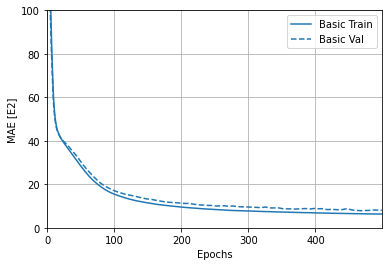

In [197]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 100])
plt.ylabel('MAE [E2]')

Text(0, 0.5, 'MSE [E2^2]')

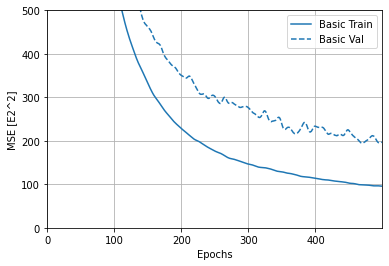

In [198]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 500])
plt.ylabel('MSE [E2^2]')

In [199]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [200]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [E2]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [E2]\')'

In [201]:
loss, mae, mse = model.evaluate(normed_test_data_E2, test_labels_E2, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} E2".format(mae))

26/26 - 0s - loss: 140.4725 - mae: 7.2029 - mse: 140.4725
Testing set Mean Abs Error:  7.20 E2


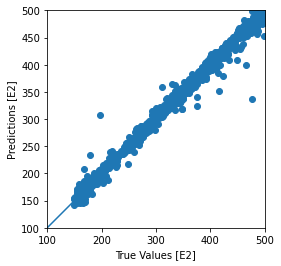

In [202]:
test_predictions_E2 = model.predict(normed_test_data_E2).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_E2, test_predictions_E2)
plt.xlabel('True Values [E2]')
plt.ylabel('Predictions [E2]')
lims = [100, 500]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("E2_ANN.png")
#files.download("E2_ANN.png") 


In [203]:
fig = px.scatter(x=test_labels_E2, y=test_predictions_E2, title="Actual vs Predicted E2")
fig.show()

In [204]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

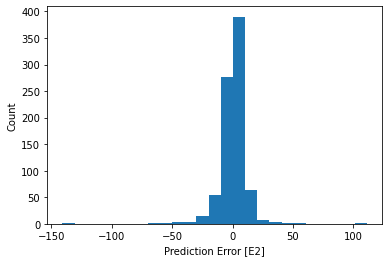

In [205]:
error_E2 = test_predictions_E2 - test_labels_E2
plt.hist(error_E2, bins = 25)
plt.xlabel("Prediction Error [E2]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [206]:
fig = px.histogram(error_E2, title='Histogram of Prediction Errors of E2', labels = {'E2' : 'error_E2'})
fig.show()

# Model for E3

In [207]:
dataset_E3 = pavement_data.drop(['E1', 'E2'], axis =1)
dataset_E3

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E3,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,160,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,190,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,100,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,105,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,119,0.298245
...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,33,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,36,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,39,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,35,0.440157


In [208]:
train_dataset_E3 = dataset_E3.iloc[:4200,:]
test_dataset_E3 = dataset_E3.iloc[4200:,:]
train_dataset_E3

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E3,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,160,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,190,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,100,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,105,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,119,0.298245
...,...,...,...,...,...,...,...,...,...,...
4195,120,366,-1.073354,-1.388016,-1.746863,-1.956233,-2.329545,-2.508626,92,0.270546
4196,147,402,-1.473160,-1.736987,-2.058541,-2.264904,-2.572558,-2.835145,122,0.218286
4197,43,419,-0.565159,-1.277691,-1.804298,-2.002258,-2.535653,-2.654699,103,0.505022
4198,199,421,-1.262803,-1.517588,-1.838034,-2.076326,-2.455969,-2.713415,108,0.186703


In [209]:
test_dataset_E3

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,E3,SN
4200,190,374,-1.540658,-1.802234,-2.092567,-2.291250,-2.580977,-2.833103,124,0.170066
4201,68,241,-0.486637,-1.363438,-2.159611,-2.787743,-3.166758,-3.047447,160,0.274840
4202,176,593,-1.630662,-1.946030,-2.263653,-2.441387,-2.716435,-2.942381,132,0.149620
4203,145,205,-1.582115,-1.930815,-2.360532,-2.622377,-3.108453,-3.389071,198,0.176629
4204,50,344,-0.489586,-1.344232,-2.156063,-2.786931,-2.746531,-3.043034,158,0.467783
...,...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,33,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,36,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,39,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,35,0.440157


In [210]:
#sns.pairplot(train_dataset_E3[['E1',	'E3',	'E3',	'H1',	'H2',	'SN',	'E3']], diag_kind="kde")

In [211]:
train_stats_E3 = train_dataset_E3.describe()
train_stats_E3.pop("E3")
train_stats_E3 = train_stats_E3.transpose()
train_stats_E3


,count,mean,std,min,25%,50%,75%,max
H1,4200.0,144.616667,61.156947,40.000000,93.000000,143.000000,198.000000,250.000000
H2,4200.0,374.573810,130.960577,150.000000,261.000000,375.000000,487.000000,600.000000
lnD1,4200.0,-1.069338,0.406850,-2.066723,-1.363056,-1.084576,-0.788150,0.285735
lnD2,4200.0,-1.460927,0.384696,-2.319935,-1.742998,-1.516722,-1.221051,-0.097481
lnD3,4200.0,-1.845874,0.428074,-2.592269,-2.195841,-1.935480,-1.555637,-0.494985
lnD4,4200.0,-2.073457,0.438742,-3.085001,-2.432381,-2.170724,-1.776305,-0.848866
lnD5,4200.0,-2.457268,0.529674,-3.466696,-2.893356,-2.570399,-2.075589,-1.109208
lnD6,4200.0,-2.652965,0.537557,-3.471191,-3.109853,-2.772269,-2.273318,-1.329196
SN,4200.0,0.250216,0.114627,0.089630,0.166944,0.220692,0.300785,1.084050


In [212]:
train_labels_E3 = train_dataset_E3.pop('E3')
test_labels_E3 = test_dataset_E3.pop('E3')

In [213]:
train_dataset_E3

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,SN
0,74,351,-1.090704,-1.644029,-2.198676,-2.418894,-2.975538,-3.105324,0.295591
1,97,226,-1.077605,-1.760493,-2.305690,-2.545039,-3.146323,-3.273596,0.141169
2,220,287,-0.917942,-1.339258,-1.731662,-1.971413,-2.411285,-2.599241,0.147625
3,60,538,-0.734115,-1.342775,-1.879870,-2.063017,-2.561356,-2.676116,0.405743
4,40,578,-1.050622,-1.746576,-2.112957,-2.270118,-2.635404,-2.831575,0.298245
...,...,...,...,...,...,...,...,...,...
4195,120,366,-1.073354,-1.388016,-1.746863,-1.956233,-2.329545,-2.508626,0.270546
4196,147,402,-1.473160,-1.736987,-2.058541,-2.264904,-2.572558,-2.835145,0.218286
4197,43,419,-0.565159,-1.277691,-1.804298,-2.002258,-2.535653,-2.654699,0.505022
4198,199,421,-1.262803,-1.517588,-1.838034,-2.076326,-2.455969,-2.713415,0.186703


In [214]:
test_dataset_E3

,H1,H2,lnD1,lnD2,lnD3,lnD4,lnD5,lnD6,SN
4200,190,374,-1.540658,-1.802234,-2.092567,-2.291250,-2.580977,-2.833103,0.170066
4201,68,241,-0.486637,-1.363438,-2.159611,-2.787743,-3.166758,-3.047447,0.274840
4202,176,593,-1.630662,-1.946030,-2.263653,-2.441387,-2.716435,-2.942381,0.149620
4203,145,205,-1.582115,-1.930815,-2.360532,-2.622377,-3.108453,-3.389071,0.176629
4204,50,344,-0.489586,-1.344232,-2.156063,-2.786931,-2.746531,-3.043034,0.467783
...,...,...,...,...,...,...,...,...,...
5020,155,373,-0.385942,-0.651526,-0.892306,-1.044493,-1.299603,-1.460113,0.300245
5021,65,234,-0.034519,-0.386398,-0.719286,-1.046855,-1.306892,-1.502873,0.461535
5022,151,231,-0.530586,-0.687881,-0.920399,-1.115901,-1.402830,-1.606592,0.479972
5023,96,336,-0.390793,-0.651698,-0.904609,-1.067172,-1.338648,-1.509095,0.440157


In [215]:
def norm(x):
  return (x - train_stats_E3['mean']) / train_stats_E3['std']
normed_train_data_E3 = norm(train_dataset_E3)
normed_test_data_E3 = norm(test_dataset_E3)

In [216]:
def build_model():
  model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(train_dataset_E3.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

In [217]:
model = build_model()

In [218]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_27 (Dense)             (None, 64)                640       
_________________________________________________________________
dense_28 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 65        
Total params: 4,865
Trainable params: 4,865
Non-trainable params: 0
_________________________________________________________________


In [219]:
example_batch = normed_train_data_E3[:10]
example_result = model.predict(example_batch)
example_result

array([[-0.23355922],
       [-0.2586682 ],
       [-0.01502699],
       [-0.01253628],
       [-0.17482904],
       [ 0.07779282],
       [-0.07513691],
       [ 0.13928431],
       [-0.02668498],
       [ 0.15036252]], dtype=float32)

In [220]:
EPOCHS = 500

history = model.fit(
  normed_train_data_E3, train_labels_E3,
  epochs=EPOCHS, validation_split = 0.2, verbose=0,
  callbacks=[tfdocs.modeling.EpochDots()])


Epoch: 0, loss:12803.1074,  mae:101.9328,  mse:12803.1074,  val_loss:8554.6338,  val_mae:82.4267,  val_mse:8554.6338,  
....................................................................................................
Epoch: 100, loss:3.3773,  mae:1.3173,  mse:3.3773,  val_loss:2.8835,  val_mae:1.2152,  val_mse:2.8835,  
....................................................................................................
Epoch: 200, loss:2.0588,  mae:1.0233,  mse:2.0588,  val_loss:3.8210,  val_mae:1.4903,  val_mse:3.8210,  
....................................................................................................
Epoch: 300, loss:1.6182,  mae:0.9037,  mse:1.6182,  val_loss:1.6043,  val_mae:0.9413,  val_mse:1.6043,  
....................................................................................................
Epoch: 400, loss:1.2975,  mae:0.8317,  mse:1.2975,  val_loss:1.1159,  val_mae:0.8485,  val_mse:1.1159,  
.......................................................

In [221]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.head()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,12803.107422,101.932770,12803.107422,8554.633789,82.426720,8554.633789,0
1,3810.314209,52.100224,3810.314209,1124.130127,28.829105,1124.130127,1
2,656.915710,20.797338,656.915710,346.985962,14.924902,346.985962,2
3,211.899033,11.392750,211.899033,136.205017,9.274772,136.205017,3
4,93.862633,7.537781,93.862633,69.239807,6.592795,69.239807,4


In [222]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

Text(0, 0.5, 'MAE [E3]')

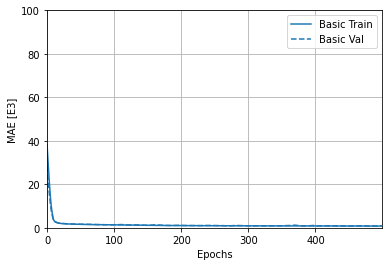

In [223]:
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 100])
plt.ylabel('MAE [E3]')

Text(0, 0.5, 'MSE [E3^2]')

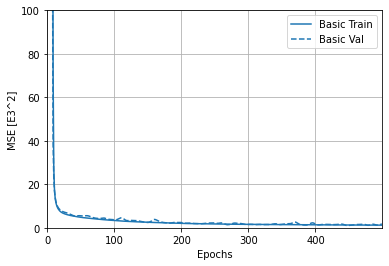

In [224]:
plotter.plot({'Basic': history}, metric = "mse")
plt.ylim([0, 100])
plt.ylabel('MSE [E3^2]')

In [225]:
'''model = build_model()

# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

early_history = model.fit(normed_train_data, train_labels, 
                    epochs=EPOCHS, validation_split = 0.2, verbose=0, 
                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])'''

"model = build_model()\n\n# The patience parameter is the amount of epochs to check for improvement\nearly_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)\n\nearly_history = model.fit(normed_train_data, train_labels, \n                    epochs=EPOCHS, validation_split = 0.2, verbose=0, \n                    callbacks=[early_stop, tfdocs.modeling.EpochDots()])"

In [226]:
'''plotter.plot({'Early Stopping': early_history}, metric = "mae")
plt.ylim([0, 0.5])
plt.ylabel('MAE [E3]')'''

'plotter.plot({\'Early Stopping\': early_history}, metric = "mae")\nplt.ylim([0, 0.5])\nplt.ylabel(\'MAE [E3]\')'

In [227]:
loss, mae, mse = model.evaluate(normed_test_data_E3, test_labels_E3, verbose=2)

print("Testing set Mean Abs Error: {:5.2f} E3".format(mae))

26/26 - 0s - loss: 3.2395 - mae: 1.3283 - mse: 3.2395
Testing set Mean Abs Error:  1.33 E3


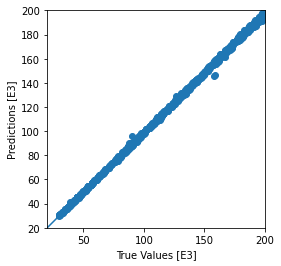

In [228]:
test_predictions_E3 = model.predict(normed_test_data_E3).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels_E3, test_predictions_E3)
plt.xlabel('True Values [E3]')
plt.ylabel('Predictions [E3]')
lims = [20, 200]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.savefig("E3_ANN.png")
#files.download("E3_ANN.png") 


In [229]:
fig = px.scatter(x=test_labels_E3, y=test_predictions_E3, title="Actual vs Predicted E3")
fig.show()

In [230]:
plt.savefig("abc.png")
#files.download("abc.png") 


<Figure size 432x288 with 0 Axes>

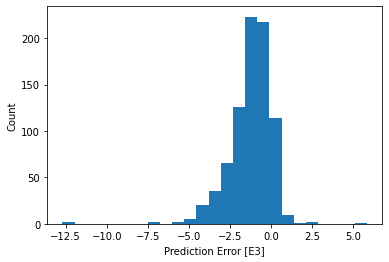

In [231]:
error_E3 = test_predictions_E3 - test_labels_E3
plt.hist(error_E3, bins = 25)
plt.xlabel("Prediction Error [E3]")
_ = plt.ylabel("Count")
plt.savefig("abc.png")
#files.download("abc.png") 


In [232]:
fig = px.histogram(error_E3, title='Histogram of Prediction Errors of E3', labels = {'E3' : 'error_E3'})
fig.show()